In [1]:
import os
import sys
import math
import logging
from pathlib import Path
import polars as pl
import plotly.express as px
import dash
import dash_bootstrap_components as dbc
import numpy as np
import scipy as sp
import sklearn
import pandas as pd
pd.set_option("display.max_rows", 120)
pd.set_option("display.max_columns", 120)
pd.set_option("display.float_format", '{:.3f}'.format)
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import polars.selectors as cs
import seaborn as sns
sns.set_context("poster")
sns.set_theme(rc={"figure.figsize": (16, 9.)})
sns.set_style("whitegrid")
logging.basicConfig(level=logging.INFO, stream=sys.stdout)
import matplotlib.pyplot as plt
import plotly.express as px
%load_ext autoreload
%autoreload 2

In [2]:
from tdt.data.obb_data import get_treasury_yields, add_bond_metrics_to_obb_data
from tdt.data.analytics import transform_pca

In [5]:
data = get_treasury_yields('2019-01-01','2025-01-01')

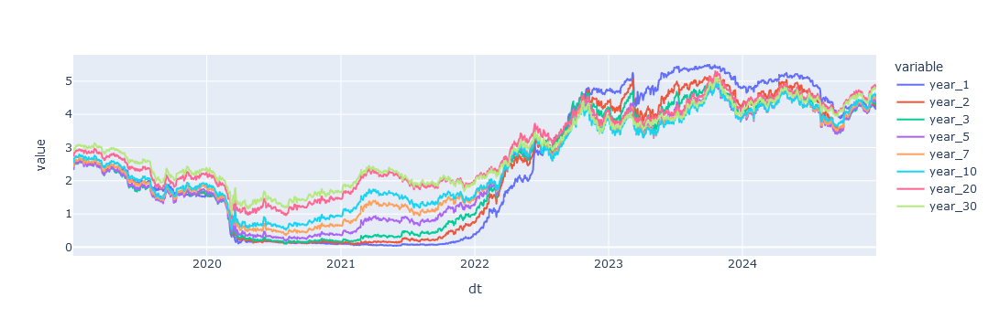

In [6]:
px.line(data.select('dt',cs.numeric().mul(100)).to_pandas().set_index('dt'))

In [7]:

final = add_bond_metrics_to_obb_data(data)

In [10]:
levels=final.with_columns(pl.col('par_yield').mul(100)).pivot(on='term',index='dt',values='par_yield')
diffs=pl.from_pandas(levels.to_pandas().set_index('dt').resample('W').last().reset_index())

In [304]:
from tdt.data.analytics import transform_pca
pca_components,reconstructed,pca = transform_pca(levels,n_components=3)

In [305]:
levels

dt,2,5,7,10,20,30
date,f32,f32,f32,f32,f32,f32
2010-01-04,1.09,2.65,3.36,3.85,4.6,4.65
2010-01-05,1.01,2.56,3.28,3.77,4.54,4.59
2010-01-06,1.01,2.6,3.33,3.85,4.63,4.7
2010-01-07,1.03,2.62,3.33,3.85,4.62,4.69
2010-01-08,0.96,2.57,3.31,3.83,4.61,4.7
…,…,…,…,…,…,…
2024-12-23,4.3,4.44,4.52,4.59,4.85,4.78
2024-12-26,4.3,4.42,4.49,4.58,4.83,4.76
2024-12-27,4.31,4.45,4.53,4.62,4.89,4.82


In [306]:
fig=px.line(pca_components.to_pandas().set_index('dt').melt(ignore_index=False).reset_index(),x='dt',y='value',facet_col='variable')
fig.update_yaxes(matches=None,showticklabels=True)
fig.update_xaxes(matches=None,showticklabels=True)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))

In [307]:
# px.line(
# reconstructed.join_asof(levels,on='dt',suffix='_og').select('dt','7','7_og').to_pandas().set_index('dt').cumsum())

SchemaError: datatypes of join keys don't match - `dt`: datetime[ms] on left does not match `dt`: date on right

In [308]:
cols= levels.columns[1:]
exposures=pd.DataFrame((pca.components_),index=['level','slope','curve']).rename(columns={k:v+'y' for k, v in enumerate(cols)}).reset_index()
fig=px.line(exposures.melt(id_vars='index',value_name='loading',var_name='term'),x='term',y='loading',
            facet_col='index',
            facet_col_wrap=2,
            facet_row_spacing=0.1,
            facet_col_spacing=0.05,
            title='PCA Loadings',
            markers=True)
fig.update_yaxes(matches=None,showticklabels=True)
fig.update_xaxes(matches=None,showticklabels=True)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))



In [209]:
pcs= pca_components

pcs

dt,level,slope,curve
date,f32,f32,f32
2019-01-02,0.010145,0.073875,-0.00566
2019-01-03,-0.159494,0.063536,0.024405
2019-01-04,0.017022,0.068076,-0.001684
2019-01-07,0.069657,0.071277,-0.016962
2019-01-08,0.123214,0.086969,-0.025539
…,…,…,…
2024-12-23,3.47972,-0.464249,-0.058024
2024-12-26,3.448144,-0.453068,-0.051191
2024-12-27,3.52532,-0.492546,-0.046535


<Axes: xlabel='dt'>

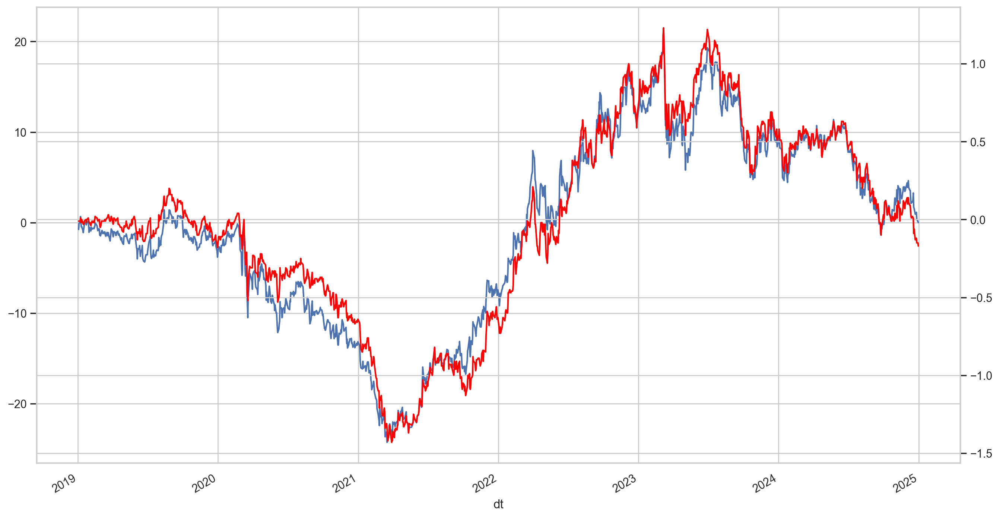

In [62]:
# d=pcs.join_asof(levels,on='dt')\
#     .with_columns(pl.col('2').sub(pl.col('10')).alias('slope_emp'))\
#     .select(pl.col('dt'),pl.col('slope'),pl.col('slope_emp')).to_pandas().set_index('dt')
# ax= d['slope'].cumsum().plot()
# ax2=ax.twinx()
# d['slope_emp'].cumsum().plot(ax=ax2,color='red')

In [16]:
# d=pcs.join_asof(levels,on='dt')\
#     .with_columns(pl.col('2').add(pl.col('7').sub(pl.col('5').mul(2))).alias('curve_emp'))\
#     .select(pl.col('dt'),pl.col('curve'),pl.col('curve_emp')).to_pandas().set_index('dt')
# ax= d['curve'].cumsum().plot()
# ax2=ax.twinx()
# d[('curve_emp')].cumsum().plot(ax=ax2,color='red')

In [17]:
# px.scatter(
#     levels\
#     .with_columns((pl.col('2').sub(pl.col('10'))).alias('257_fly'))\
#     .join_asof(pca_components,on='dt')\
#     .select(pl.col('dt'),pl.col('257_fly'),pl.col('level'),pl.col('slope'),pl.col('curve')).sort('dt'),
#     x='level',y='257_fly'
# )


In [311]:
from tdt.data.analytics import compute_weighted_butterfly_levels
short=['2','10']
long='5'



In [351]:
from tdt.data.analytics import transform_pca,solve_for_neutrality,compute_weighted_butterfly_levels


In [352]:

rates= compute_weighted_butterfly_levels(levels,duration,short,long)


[np.float32(-1.2309252), np.float32(1.0), np.float32(0.42486075)]


In [293]:

rates

dt,2,5,7,10,20,30,mv_neut_2510_fly,mv_wts,dv01_neut_2510_fly,dv01_wts,pca_neut_2510_fly,pca_wts
date,f32,f32,f32,f32,f32,f32,f32,list[f64],f32,list[f64],f32,list[f32]
2019-01-02,2.5,2.49,2.56,2.66,2.83,2.97,5.14,"[-0.5, 1.0, -0.5]",-1.159992,"[1.167526, 1.0, 0.274879]",2.257013,"[0.535767, 2.0, 0.520139]"
2019-01-03,2.39,2.37,2.44,2.56,2.75,2.92,4.91,"[-0.5, 1.0, -0.5]",-1.124076,"[1.167526, 1.0, 0.274879]",2.127962,"[0.535767, 2.0, 0.520139]"
2019-01-04,2.5,2.49,2.56,2.67,2.83,2.98,5.15,"[-0.5, 1.0, -0.5]",-1.16274,"[1.167526, 1.0, 0.274879]",2.251812,"[0.535767, 2.0, 0.520139]"
2019-01-07,2.53,2.53,2.6,2.7,2.86,2.99,5.23,"[-0.5, 1.0, -0.5]",-1.166013,"[1.167526, 1.0, 0.274879]",2.300134,"[0.535767, 2.0, 0.520139]"
2019-01-08,2.58,2.58,2.63,2.73,2.88,3.0,5.31,"[-0.5, 1.0, -0.5]",-1.182635,"[1.167526, 1.0, 0.274879]",2.357742,"[0.535767, 2.0, 0.520139]"
…,…,…,…,…,…,…,…,…,…,…,…,…
2024-12-23,4.3,4.44,4.52,4.59,4.85,4.78,9.17,"[-0.5, 1.0, -0.5]",-1.842054,"[1.167526, 1.0, 0.274879]",4.188765,"[0.535767, 2.0, 0.520139]"
2024-12-26,4.3,4.42,4.49,4.58,4.83,4.76,9.12,"[-0.5, 1.0, -0.5]",-1.859305,"[1.167526, 1.0, 0.274879]",4.153966,"[0.535767, 2.0, 0.520139]"
2024-12-27,4.31,4.45,4.53,4.62,4.89,4.82,9.210001,"[-0.5, 1.0, -0.5]",-1.851975,"[1.167526, 1.0, 0.274879]",4.187803,"[0.535767, 2.0, 0.520139]"


In [353]:
pca_components,_,_r = transform_pca(levels.with_columns(cs.numeric().diff()).drop_nulls(),n_components=3)
a=pca_components.join_asof(rates.select('dt',cs.matches('*fly').diff()).drop_nulls(),on='dt').to_pandas()


,dt,level,slope,curve,mv_neut_2510_fly,dv01_neut_2510_fly,pca_neut_2510_fly
0,2010-01-04,-0.907,-1.694,-0.100,NaN,NaN,NaN
1,2010-01-11,-3.401,0.534,0.069,-0.320,-0.106,-0.017
2,2010-01-18,-2.612,-0.154,-0.158,0.130,0.054,0.021
3,2010-01-25,-0.975,-0.154,-0.103,0.150,-0.020,-0.011
4,2010-02-01,-2.362,-0.707,0.318,-0.210,-0.025,-0.041
...,...,...,...,...,...,...,...
772,2024-12-02,-1.065,-0.504,-0.210,0.050,0.074,0.046
773,2024-12-09,4.808,-0.464,0.280,0.510,-0.058,-0.002
774,2024-12-16,2.795,-0.305,-0.205,-0.120,0.041,0.015
775,2024-12-23,0.618,-0.277,0.192,-0.280,-0.036,-0.032


In [354]:
from tdt.data.charting import create_scatter_grid
create_scatter_grid(a)



In [343]:
pca_components

dt,level,slope,curve
date,f32,f32,f32
2010-01-05,-3.476206,-0.717148,-0.076614
2010-01-06,2.832716,-1.540621,0.262929
2010-01-07,0.138309,0.566907,-0.049325
2010-01-08,-1.243919,-1.389886,-0.185587
2010-01-11,0.753967,-0.722938,0.091107
…,…,…,…
2024-12-23,2.52995,-0.692383,-0.643813
2024-12-26,-0.783059,0.188213,0.183768
2024-12-27,1.829468,-0.699271,0.158055


array([-0.06585204,  1.        , -1.268491  ])